Check CUDA

In [ ]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("CUDA devices:", torch.cuda.device_count())
print("Current device:", torch.cuda.current_device())

Check pixel coord file

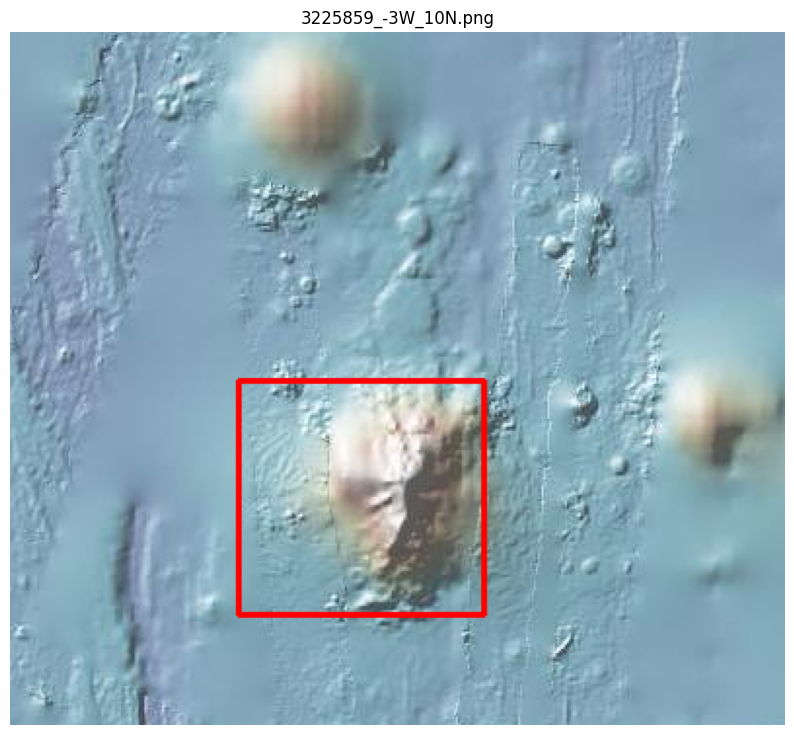

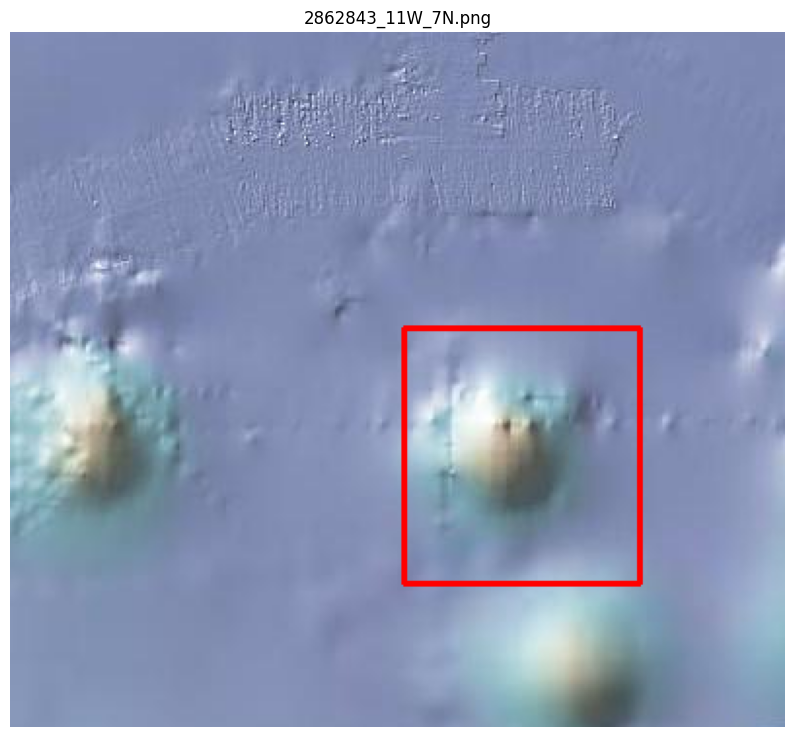

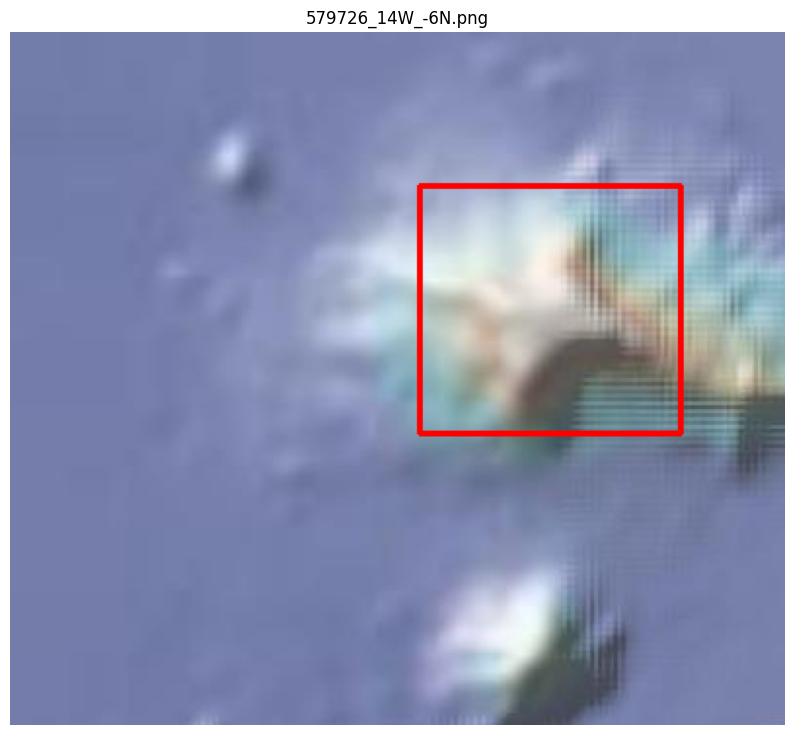

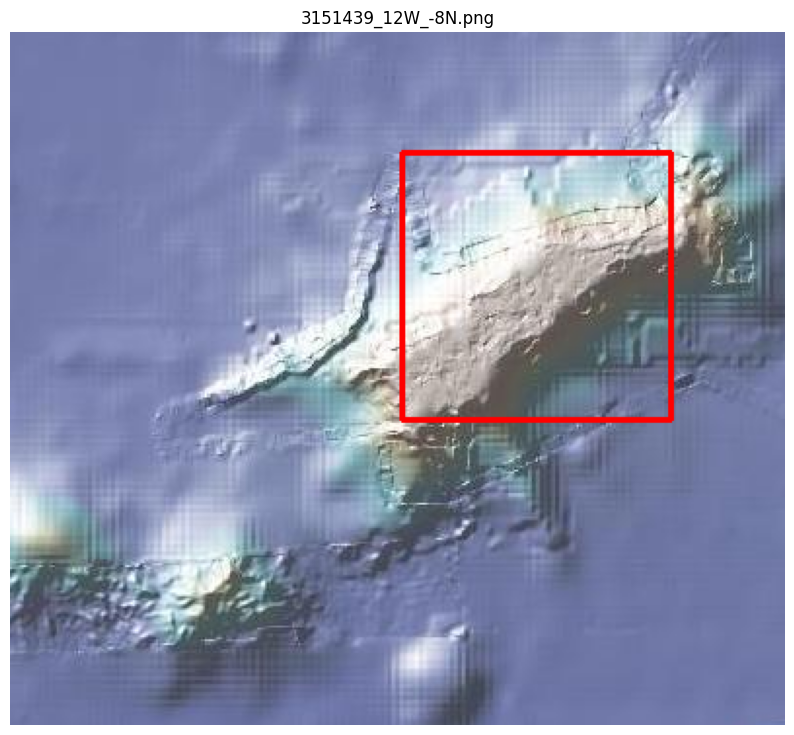

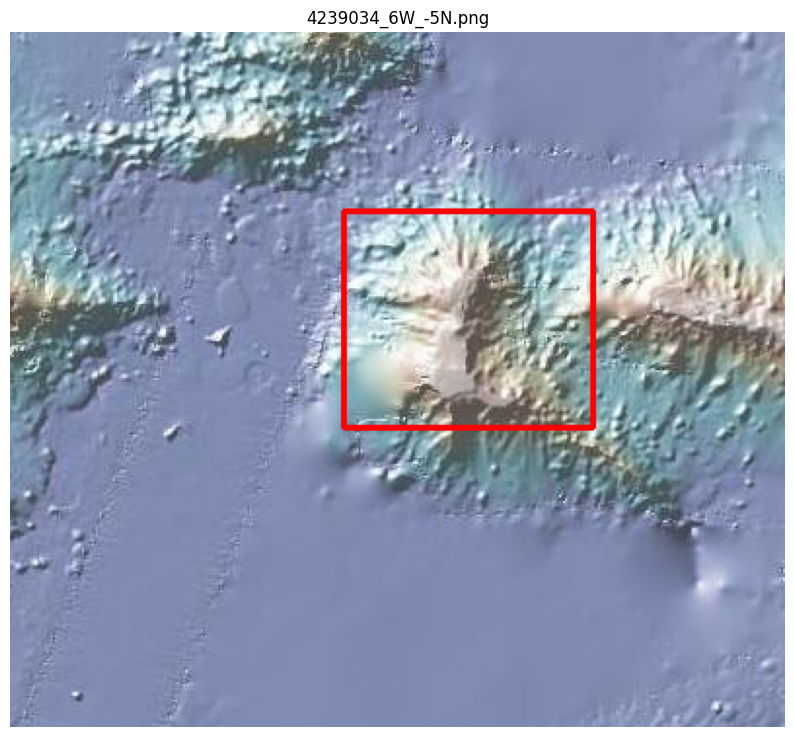

...

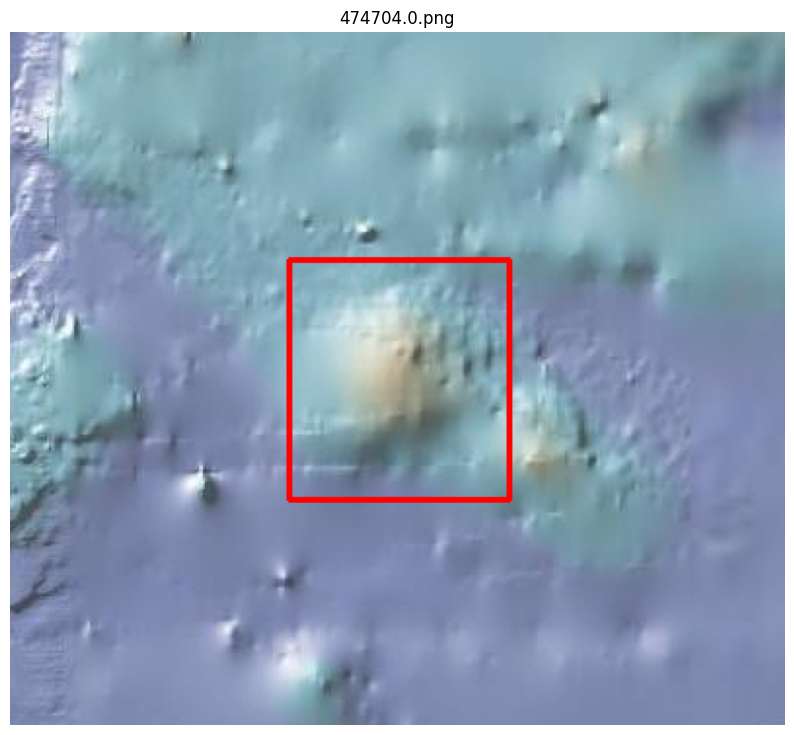

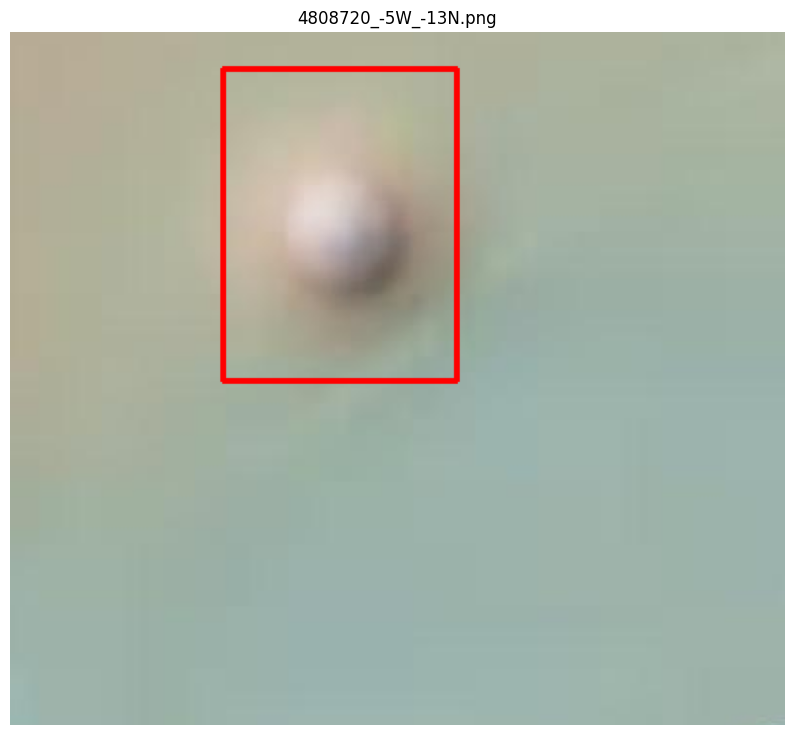

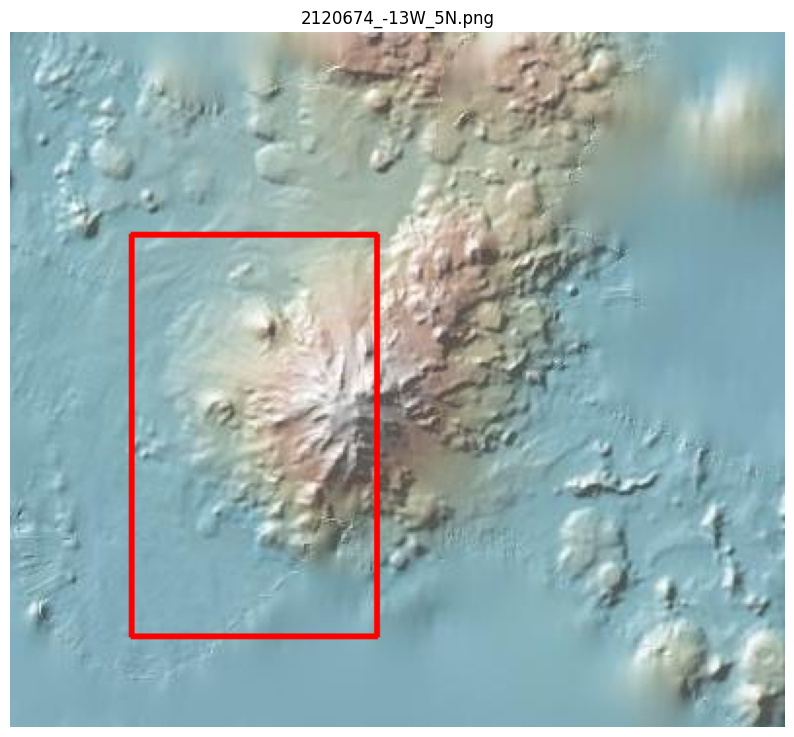

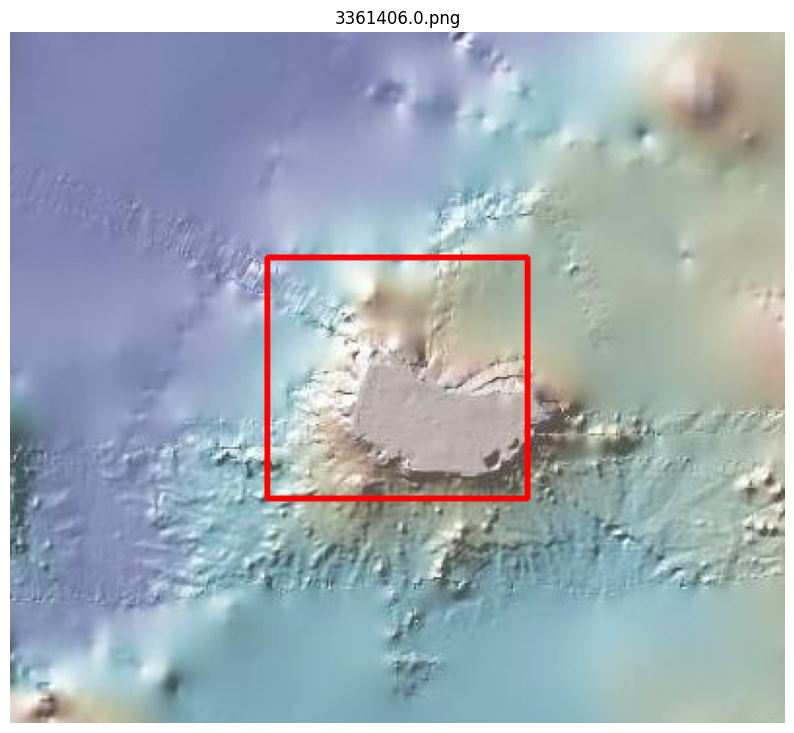

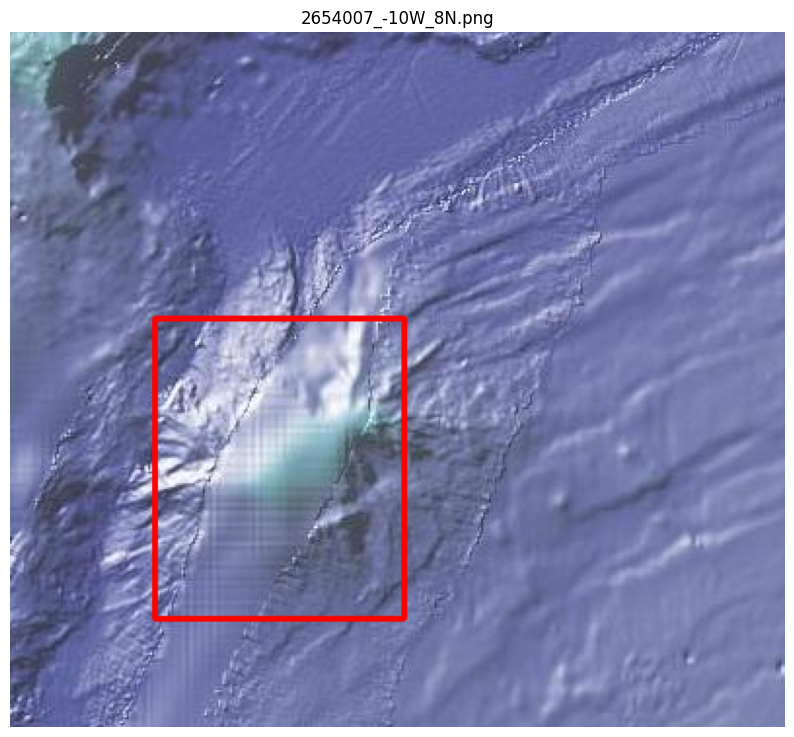

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os

# Path to your folder containing images
image_folder = '../1_DatasetCharacteristics/seamounts_seg_cropped'

# Load the CSV file
csv_file = '../1_DatasetCharacteristics/merged_pixel_coordinates.csv'
df = pd.read_csv(csv_file)

# Select 20 random rows from the DataFrame
random_rows = df.sample(n=20, random_state=42)  # 'random_state' ensures reproducibility

# Loop through the randomly selected rows
for _, row in random_rows.iterrows():
    # Get image file name and bounding box coordinates
    image_name = row['image_name']
    x_min, y_min, x_max, y_max = int(row['x_min']), int(row['y_min']), int(row['x_max']), int(row['y_max'])

    # Load the image
    image_path = os.path.join(image_folder, image_name)
    image = cv2.imread(image_path)

    # Check if the image is loaded successfully
    if image is None:
        print(f"Error: Could not load image {image_name}")
        continue

    # Convert image from BGR (OpenCV format) to RGB (matplotlib format)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw the bounding box on the image
    cv2.rectangle(image_rgb, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)  # Red bounding box

    # Display the image with the bounding box
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis('off')  # Turn off axis
    plt.title(image_name)
    plt.show()


Epoch 1/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 14s 57ms/step - loss: 0.1092 - mae: 0.2862 - val_loss: 0.0085 - val_mae: 0.1050
Epoch 2/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0137 - mae: 0.1325 - val_loss: 0.0062 - val_mae: 0.0887
Epoch 3/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - loss: 0.0106 - mae: 0.1158 - val_loss: 0.0046 - val_mae: 0.0744
Epoch 4/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0087 - mae: 0.1043 - val_loss: 0.0057 - val_mae: 0.0859
Epoch 5/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0077 - mae: 0.0976 - val_loss: 0.0037 - val_mae: 0.0665
Epoch 6/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 0.0063 - mae: 0.0881 - val_loss: 0.0036 - val_mae: 0.0662
Epoch 7/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0062 - mae: 0.0872 - val_loss: 0.0037 - val_mae: 0.0661
Epoch 8/100
125/125 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0057 - mae: 0.0834 - val_loss: 0.0035 - val_mae: 0.0647
Epoch 9/100
125/125 ━━━━━━━━━━━━━━━━━━━

Model saved to objdet_standalone_1_0_model.h5
16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - loss: 0.0024 - mae: 0.0513
Validation Loss: 0.0024891963694244623, Validation MAE: 0.051778022199869156


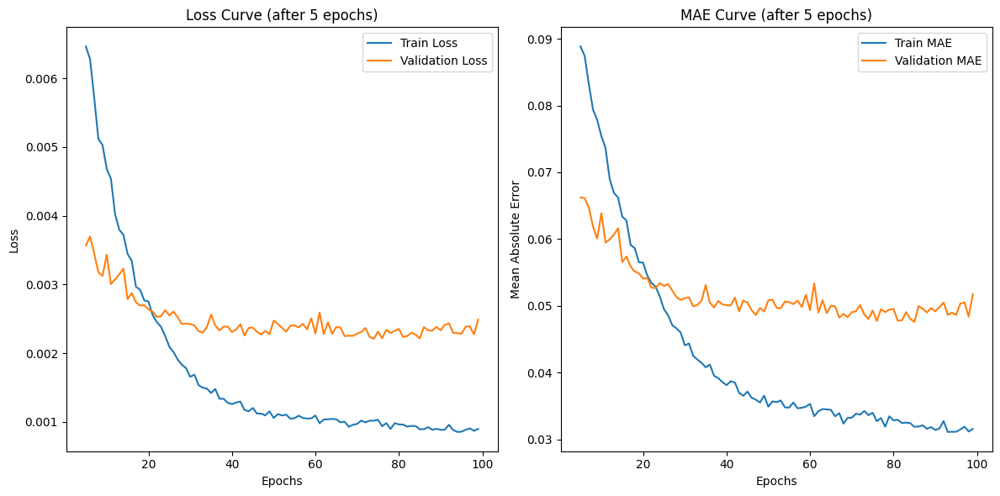

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


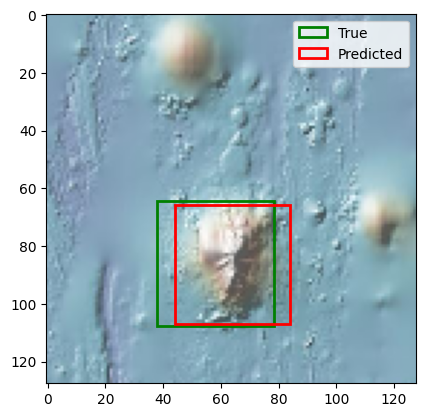

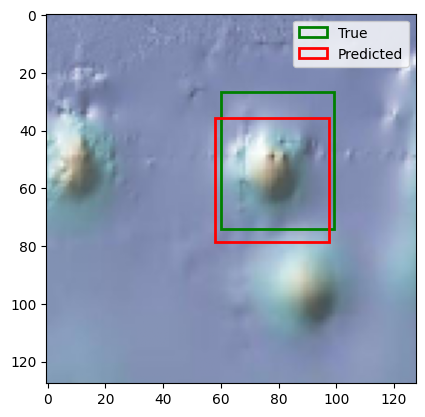

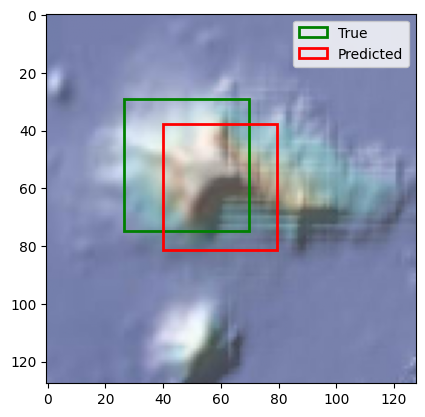

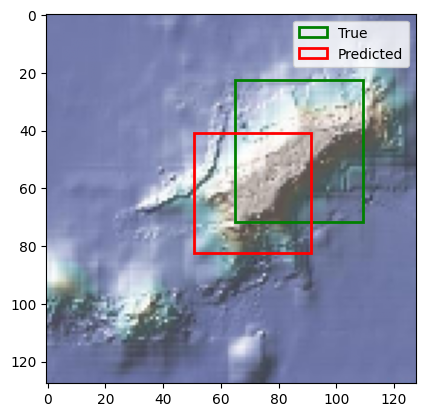

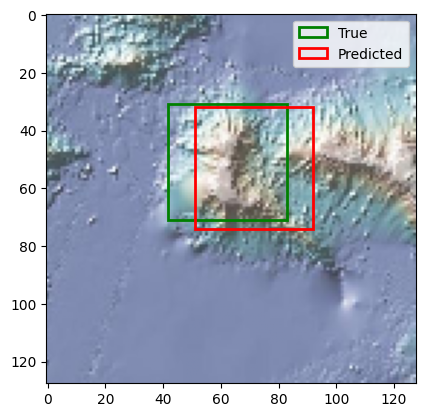

In [1]:
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Paths to data
image_dir = "/content/train"
csv_path = "/content/merged_pixel_coordinates.csv"

# Constants
IMAGE_SIZE = (128, 128)  # Resize images to 256x256
BATCH_SIZE = 16
EPOCHS = 100

# Load bounding box data
bbox_data = pd.read_csv(csv_path)

# Function to load images
def load_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)  # Load in color (BGR format)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB format
    image = image / 255.0  # Normalize pixel values to [0, 1]
    return image

# Function to preprocess bounding boxes
def preprocess_bboxes(row, original_size, resized_size):
    x_min, y_min, x_max, y_max = row[['x_min', 'y_min', 'x_max', 'y_max']]
    orig_height, orig_width = original_size
    resized_height, resized_width = resized_size

    # Scale the bounding box coordinates according to the resizing ratio
    x_min = x_min * (resized_width / orig_width)
    y_min = y_min * (resized_height / orig_height)
    x_max = x_max * (resized_width / orig_width)
    y_max = y_max * (resized_height / orig_height)

    # Normalize coordinates to [0, 1]
    x_min /= resized_width
    y_min /= resized_height
    x_max /= resized_width
    y_max /= resized_height

    return [x_min, y_min, x_max, y_max]

# Prepare dataset
images = []
bboxes = []
for _, row in bbox_data.iterrows():
    img_path = os.path.join(image_dir, row['image_name'])
    if os.path.exists(img_path):
        # Load image without resizing to get original dimensions
        original_image = load_image(img_path)
        original_size = (original_image.shape[0], original_image.shape[1])

        # Preprocess bounding box
        bbox = preprocess_bboxes(row, original_size, IMAGE_SIZE)
        bboxes.append(bbox)

        # Resize the image
        resized_image = cv2.resize(original_image, IMAGE_SIZE)
        images.append(resized_image)

images = np.array(images)
bboxes = np.array(bboxes)

# Split data
X_train, X_val, y_train, y_val = train_test_split(images, bboxes, test_size=0.2, random_state=42)

# Define Huber loss
def huber_loss(y_true, y_pred, delta=1.0):
    error = y_true - y_pred
    is_small_error = tf.abs(error) <= delta
    small_error_loss = 0.5 * tf.square(error)
    large_error_loss = delta * (tf.abs(error) - 0.5 * delta)
    return tf.where(is_small_error, small_error_loss, large_error_loss)

# Define the model architecture
def create_model():
    inputs = layers.Input(shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3))  # 3 channels for RGB
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Flatten()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.5)(x)  # Add dropout to prevent overfitting
    outputs = layers.Dense(4, activation='linear')(x)  # Use 'linear' activation for raw predictions
    model = models.Model(inputs, outputs)
    return model

# Compile model with Huber loss
model = create_model()
model.compile(optimizer='adam', loss=huber_loss, metrics=['mae'])

# Training and validation loss/MAE visualization (Learning curve)
def plot_learning_curve(history, start_epoch=5):
    # Extract loss and MAE for training and validation data
    train_loss = history.history['loss'][start_epoch:]
    val_loss = history.history['val_loss'][start_epoch:]
    train_mae = history.history['mae'][start_epoch:]
    val_mae = history.history['val_mae'][start_epoch:]

    # Plot training and validation loss
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(range(start_epoch, len(history.history['loss'])), train_loss, label='Train Loss')
    plt.plot(range(start_epoch, len(history.history['val_loss'])), val_loss, label='Validation Loss')
    plt.title('Loss Curve (after 5 epochs)')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot training and validation MAE
    plt.subplot(1, 2, 2)
    plt.plot(range(start_epoch, len(history.history['mae'])), train_mae, label='Train MAE')
    plt.plot(range(start_epoch, len(history.history['val_mae'])), val_mae, label='Validation MAE')
    plt.title('MAE Curve (after 5 epochs)')
    plt.xlabel('Epochs')
    plt.ylabel('Mean Absolute Error')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Train the model and get history
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1
)

# Save the trained model
model_save_path = "objdet_standalone_1_0_model.h5"  # Path where the model will be saved
model.save(model_save_path)
print(f"Model saved to {model_save_path}")

# Evaluate model performance
val_loss, val_mae = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation MAE: {val_mae}")

# Plot learning curve after training, starting from epoch 5
plot_learning_curve(history, start_epoch=5)

# Visualize predictions
def plot_predictions(images, true_bboxes, pred_bboxes):
    for i in range(5):  # Show 5 examples
        img = images[i]
        true_bbox = true_bboxes[i]
        pred_bbox = pred_bboxes[i]

        plt.imshow(img)
        h, w, _ = img.shape

        # Plot true bounding box
        true_rect = [
            true_bbox[0] * w, true_bbox[1] * h,
            (true_bbox[2] - true_bbox[0]) * w, (true_bbox[3] - true_bbox[1]) * h
        ]
        plt.gca().add_patch(plt.Rectangle(
            (true_rect[0], true_rect[1]),
            true_rect[2], true_rect[3],
            edgecolor='green', facecolor='none', lw=2, label='True'
        ))

        # Plot predicted bounding box
        pred_rect = [
            pred_bbox[0] * w, pred_bbox[1] * h,
            (pred_bbox[2] - pred_bbox[0]) * w, (pred_bbox[3] - pred_bbox[1]) * h
        ]
        plt.gca().add_patch(plt.Rectangle(
            (pred_rect[0], pred_rect[1]),
            pred_rect[2], pred_rect[3],
            edgecolor='red', facecolor='none', lw=2, label='Predicted'
        ))

        plt.legend()
        plt.show()

# Make predictions on the validation set
pred_bboxes = model.predict(X_val)

# Plot predictions vs true bounding boxes
plot_predictions(X_val, y_val, pred_bboxes)



In [2]:
print(model)  # This will throw an error if model is not defined

<Functional name=functional, built=True>


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step


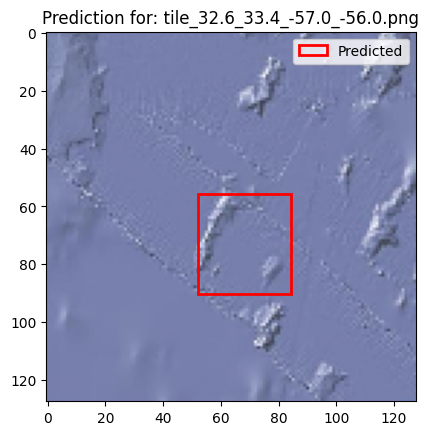

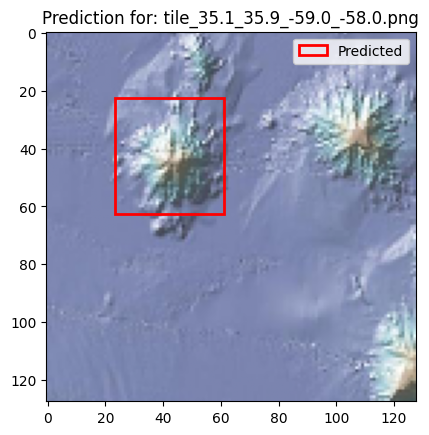

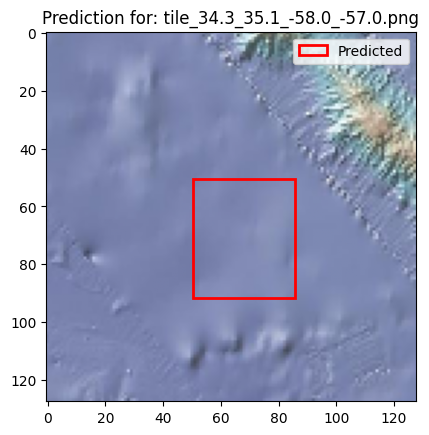

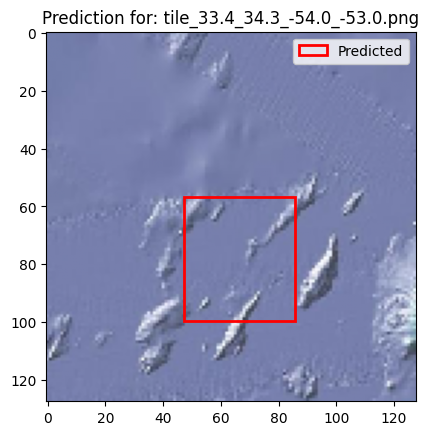

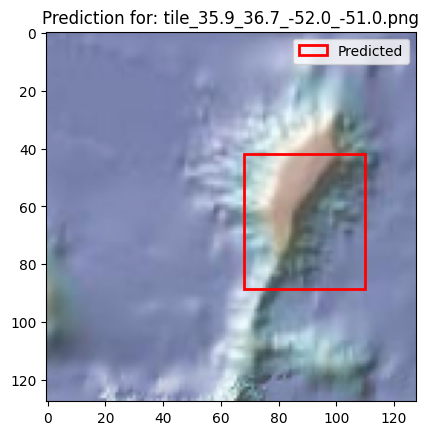

Predictions saved to /content/predicted_bboxes.csv


In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path to the folder containing unseen images
unlabeled_image_dir = "/content/test"  # Path to the folder with unseen images

# Function to load and preprocess images from the unseen dataset
def load_and_preprocess_unlabeled_images(image_dir, image_size):
    images = []
    image_paths = []

    # Iterate over all files in the folder
    for image_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, image_name)

        if os.path.isfile(img_path):
            # Load the image
            image = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Load in color (BGR format)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB format
            image = cv2.resize(image, image_size)  # Resize to match model input size
            image = image / 255.0  # Normalize pixel values to [0, 1]
            images.append(image)
            image_paths.append(img_path)

    images = np.array(images)
    return images, image_paths

# Load and preprocess unseen images
unlabeled_images, unlabeled_image_paths = load_and_preprocess_unlabeled_images(unlabeled_image_dir, IMAGE_SIZE)

# Make predictions on the unseen images
pred_bboxes_unlabeled = model.predict(unlabeled_images)

# Function to plot predictions on the unseen images
def plot_predictions_on_unlabeled(images, bboxes, image_paths):
    for i in range(min(5, len(images))):  # Show first 5 predictions or less
        img = images[i]
        pred_bbox = bboxes[i]
        img_path = image_paths[i]

        # Plot the image
        plt.imshow(img)
        h, w, _ = img.shape

        # Plot predicted bounding box
        pred_rect = [
            pred_bbox[0] * w, pred_bbox[1] * h,
            (pred_bbox[2] - pred_bbox[0]) * w, (pred_bbox[3] - pred_bbox[1]) * h
        ]
        plt.gca().add_patch(plt.Rectangle(
            (pred_rect[0], pred_rect[1]),
            pred_rect[2], pred_rect[3],
            edgecolor='red', facecolor='none', lw=2, label='Predicted'
        ))

        plt.title(f"Prediction for: {os.path.basename(img_path)}")
        plt.legend()
        plt.show()

# Plot predictions on the first few unseen images
plot_predictions_on_unlabeled(unlabeled_images, pred_bboxes_unlabeled, unlabeled_image_paths)

# Optionally, save the predicted bounding boxes to a CSV file
def save_predictions_to_csv(image_paths, bboxes, output_csv_path):
    bbox_data = []

    for img_path, bbox in zip(image_paths, bboxes):
        img_name = os.path.basename(img_path)
        bbox_data.append([img_name, *bbox])

    bbox_df = pd.DataFrame(bbox_data, columns=['image_name', 'x_min', 'y_min', 'x_max', 'y_max'])
    bbox_df.to_csv(output_csv_path, index=False)
    print(f"Predictions saved to {output_csv_path}")

# Save predictions to a CSV file
output_csv_path = "/content/predicted_bboxes.csv"
save_predictions_to_csv(unlabeled_image_paths, pred_bboxes_unlabeled, output_csv_path)
